In [1]:
from pathlib import Path
import os
import pandas as pd
import sys
import requests
from functools import partial
from tqdm import tqdm

import torch
import torchvision
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch 
from einops import rearrange, repeat
from loguru import logger
from torchmetrics import Metric, BootStrapper
import matplotlib.pyplot as plt
from PIL import Image
import pickle
import seaborn as sns
from matplotlib.pyplot import figure
from cka import gram, centering_mat, centered_gram, unbiased_hsic_xy, MinibatchCKA, HookedCache, make_pairwise_metrics, update_metrics, get_simmat_from_metrics
import numpy as np
import re

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import timm
from timm.utils import accuracy
from torch.utils.tensorboard import SummaryWriter

from get_models import get_model

writer = SummaryWriter()

DEVICE = torch.device('cpu')
if torch.cuda.is_available():
  DEVICE = torch.device('cuda')

### Create ImageNet validation dataset

In [2]:
# using the validation transforms
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            normalize,
        ])

## Randomly subsample features too

data_path='/datasets01/imagenet_full_size/061417/'
dataset = torchvision.datasets.ImageFolder(data_path + 'val', transform=transform)

In [3]:
data_loader = torch.utils.data.DataLoader(dataset,
                                        batch_size=128,
                                        shuffle=False,
                                        pin_memory=False)

log_every = 10
do_log = True

## Compare finetuning dynamics

In [4]:
from ast import literal_eval

In [5]:
results = {'MAE': [], 'MoCoV3': [], 'DINO': []}

for key in results:
    folder_name = "../checkpoints/" + key.lower() + "-ft-all/"
    log_file = folder_name + "ft_log.txt"

    log_list = []
    print(log_file)
    if os.path.isfile(log_file): 
        with open(log_file, "r") as log:
            for line in log:
                log_dict = literal_eval(line)
                log_list.append(log_dict)
               
    df = pd.DataFrame(log_list)
    df = df.set_index('epoch')
    df = df[~df.index.duplicated(keep='first')]
    results[key] = df

../checkpoints/mae-ft-all/ft_log.txt
../checkpoints/mocov3-ft-all/ft_log.txt
../checkpoints/dino-ft-all/ft_log.txt


In [6]:
module_cols = [col for col in results['MAE'].columns if ('module.' in col and 'head' not in col)]

In [7]:
distances = pd.read_csv('PT_to_FT_dist.csv')
distances.rename(columns={'MoCo-V3':'MoCoV3'}, inplace=True)

In [7]:
for key in results['MAE']:
        print(key)

train_lr
train_loss
train_norm_params_before_update
train_norm_params_after_update
train_norm_params_change
train_
train_module
train_module.patch_embed
train_module.patch_embed.proj
train_module.blocks
train_module.blocks.0
train_module.blocks.0.norm1
train_module.blocks.0.attn
train_module.blocks.0.attn.qkv
train_module.blocks.0.attn.proj
train_module.blocks.0.norm2
train_module.blocks.0.mlp
train_module.blocks.0.mlp.fc1
train_module.blocks.0.mlp.fc2
train_module.blocks.1
train_module.blocks.1.norm1
train_module.blocks.1.attn
train_module.blocks.1.attn.qkv
train_module.blocks.1.attn.proj
train_module.blocks.1.norm2
train_module.blocks.1.mlp
train_module.blocks.1.mlp.fc1
train_module.blocks.1.mlp.fc2
train_module.blocks.2
train_module.blocks.2.norm1
train_module.blocks.2.attn
train_module.blocks.2.attn.qkv
train_module.blocks.2.attn.proj
train_module.blocks.2.norm2
train_module.blocks.2.mlp
train_module.blocks.2.mlp.fc1
train_module.blocks.2.mlp.fc2
train_module.blocks.3
train_module.

In [9]:
for key in results:
    results[key]['change_lr'] = results[key]['train_norm_params_change'] / results[key]['train_lr']
    results[key]['change_lr_cumsum'] = results[key]['change_lr'].cumsum()
    results[key]['train_norm_params_change_cumsum'] = results[key]['train_norm_params_change'].cumsum()

    results[key].rename(columns={"change_lr": "L2-norm ΔParameters (LR scaled)", "train_norm_params_change": "L2-norm ΔParameters", "train_norm_params_after_update": 
                                "L2-norm Parameters", "change_lr_cumsum": "L2-norm ΔParameters (LR scaled, Cumulative Sum)", "train_norm_params_change_cumsum": 
                                "L2-norm ΔParameters (Cumulative Sum)"}, inplace=True)

    results[key]['L2-norm ΔParameters / L2-norm Parameters'] = results[key]['L2-norm ΔParameters'] / results[key]['L2-norm Parameters']
    results[key]['L2-norm ΔParameters / L2-norm Parameters (converged)'] = results[key]['L2-norm ΔParameters'] / results[key]['L2-norm Parameters'].iloc[-1]
    results[key]['L2-norm ΔParameters / L2-norm Parameters (initial)'] = results[key]['L2-norm ΔParameters'] / results[key]['L2-norm Parameters'].iloc[0]
    

In [ ]:
for key in results:
    for module in module_cols:
        layer_name = module.split('train_module.')[-1]
        results[key][module+'_cumsum'] = results[key][module].cumsum()
        results[key][module+'_scaled'] = results[key][module] / distances.loc[distances.layer==layer_name, key].item()
        results[key][module+'_scaled_cumsum'] = results[key][module+'_scaled'].cumsum()

In [8]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [9]:
def dynamics_plot(fig_dir, df1, df2, name1, name2, col):

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)

    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(12, 9), dpi=300, sharex=True)

    sns.lineplot(x='epoch', y=col, data = df1, ax = ax1)
    sns.lineplot(x='epoch', y=col, data = df2, ax = ax1)

    axins1 = inset_axes(ax1,  "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y=col, data = df1, ax = axins1)
    sns.lineplot(x='epoch', y=col, data = df2, ax = axins1)
    axins1.set_xlim([0,8])
    axins1.set_xlabel("")
    axins1.set_ylabel("")

    sns.lineplot(x='epoch', y='test_acc1', data = df1, linestyle='--', ax = ax2)
    sns.lineplot(x='epoch', y='test_acc1', data = df2, linestyle='--', ax = ax2)

    axins2 = inset_axes(ax2, "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y='test_acc1', data = df1, linestyle='--', ax = axins2)
    sns.lineplot(x='epoch', y='test_acc1', data = df2, linestyle='--', ax = axins2)
    axins2.set_xlim([0,8])
    axins2.set_xlabel("")
    axins2.set_ylabel("")

    sns.lineplot(x='epoch', y='test_acc5', data = df1, linestyle='dashdot', ax = ax3)
    sns.lineplot(x='epoch', y='test_acc5', data = df2, linestyle='dashdot', ax = ax3)

    axins3 = inset_axes(ax3, "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y='test_acc5', data = df1, linestyle='--', ax = axins3)
    sns.lineplot(x='epoch', y='test_acc5', data = df2, linestyle='--', ax = axins3)
    axins3.set_xlim([0,8])
    axins3.set_xlabel("")
    axins3.set_ylabel("")

    ax3.set_xlabel("Fine-tuning Epochs")
    ax1.set_ylabel(col)
    ax2.set_ylabel('Test accuracy top-1')
    ax3.set_ylabel('Test accuracy top-5')

    ax2.legend(title='Pre-training algorithm', loc='lower center', labels=[name1, name2])
    plt.tight_layout()
    plt.show()

    fig.savefig(fig_dir+name1+'-'+name2+'.png')

    return fig


In [10]:
def dynamics_plot_single(fig_dir, df1, df2, df3, name1, name2, name3, col):

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)

    fig, ax = plt.subplots(figsize=(12, 9), dpi=300, sharex=True)

    sns.lineplot(x='epoch', y=col, data = df1, ax = ax)
    sns.lineplot(x='epoch', y=col, data = df2, ax = ax)
    sns.lineplot(x='epoch', y=col, data = df3, ax = ax)

    '''
    axins = inset_axes(ax,  "25%", "40%" ,loc="upper right", borderpad=2.5)
    sns.lineplot(x='epoch', y=col, data = df1, ax = axins)
    sns.lineplot(x='epoch', y=col, data = df2, ax = axins)
    sns.lineplot(x='epoch', y=col, data = df3, ax = axins)
    axins.set_xlim([0,8])
    axins.set_xlabel("")
    axins.set_ylabel("")
    '''
    
    ax.set_xlabel("Fine-tuning Epochs")
    ax.set_ylabel(col)
    
    ax.legend(title='Pre-training algorithm', loc='lower center', labels=[name1, name2, name3])
    plt.tight_layout()
    plt.show()

    fig.savefig(fig_dir+name1+'-'+name2+'-'+name3+'.png')

    return fig

In [11]:
import itertools

In [ ]:
fig_dir = '../figures/dynamics/'

prod = itertools.combinations(results.keys(), 2)

for name1, name2 in prod:

    for col in ["test_acc1", "test_acc5"]:
        full_fig_dir = fig_dir + col + '/'
        fig = dynamics_plot_single(full_fig_dir, results[name1], results[name2], name1, name2, col=col)

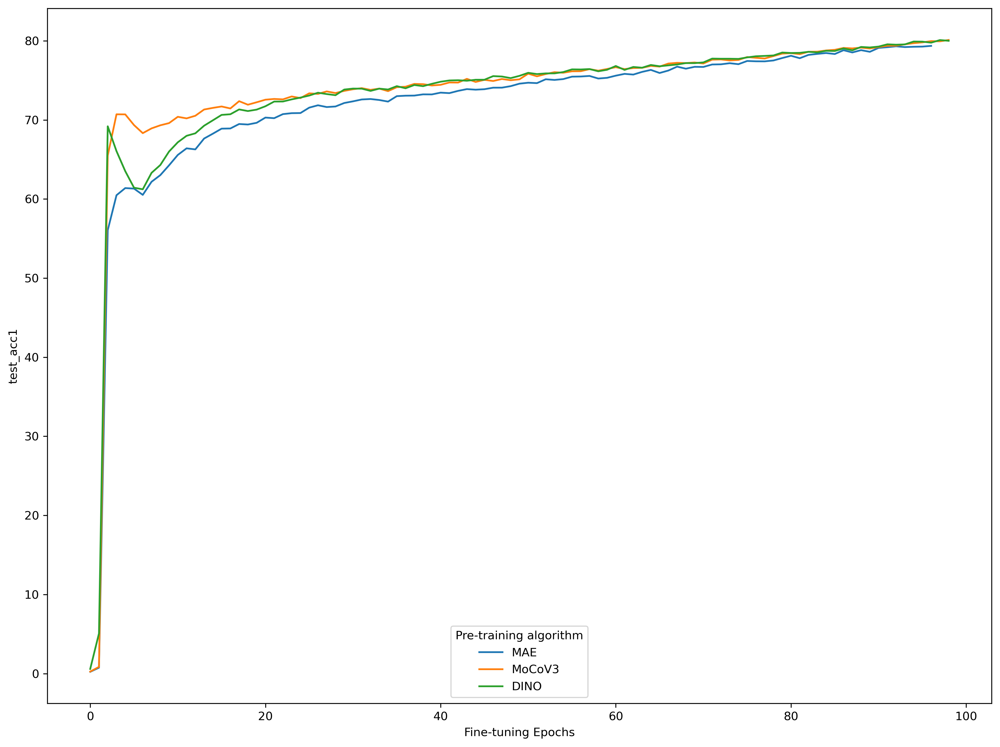

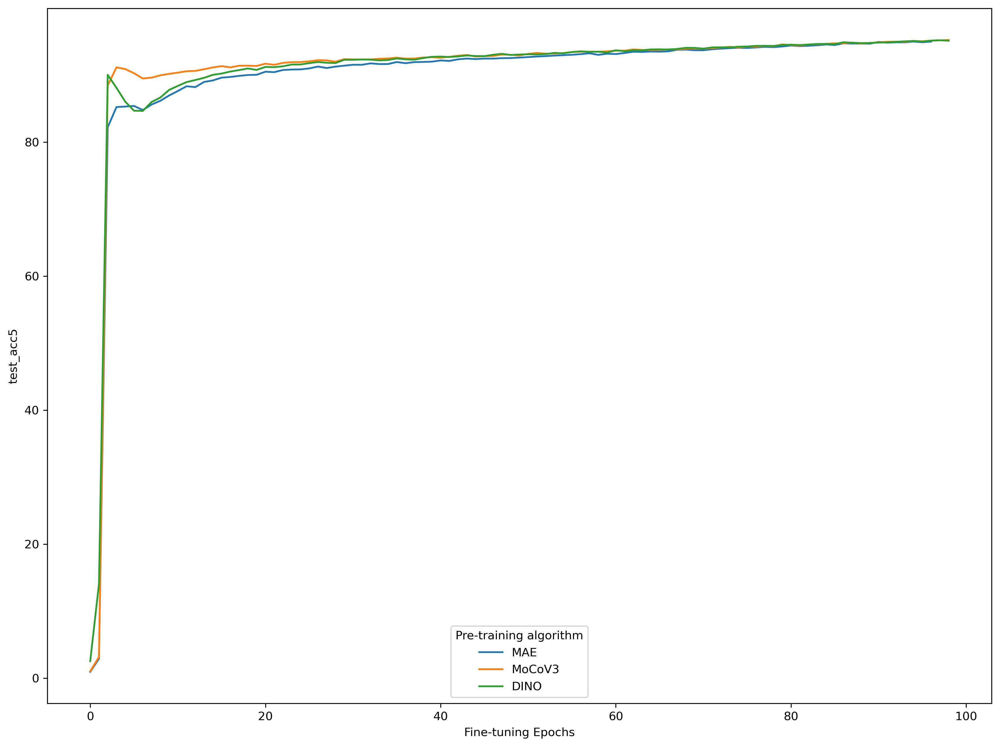

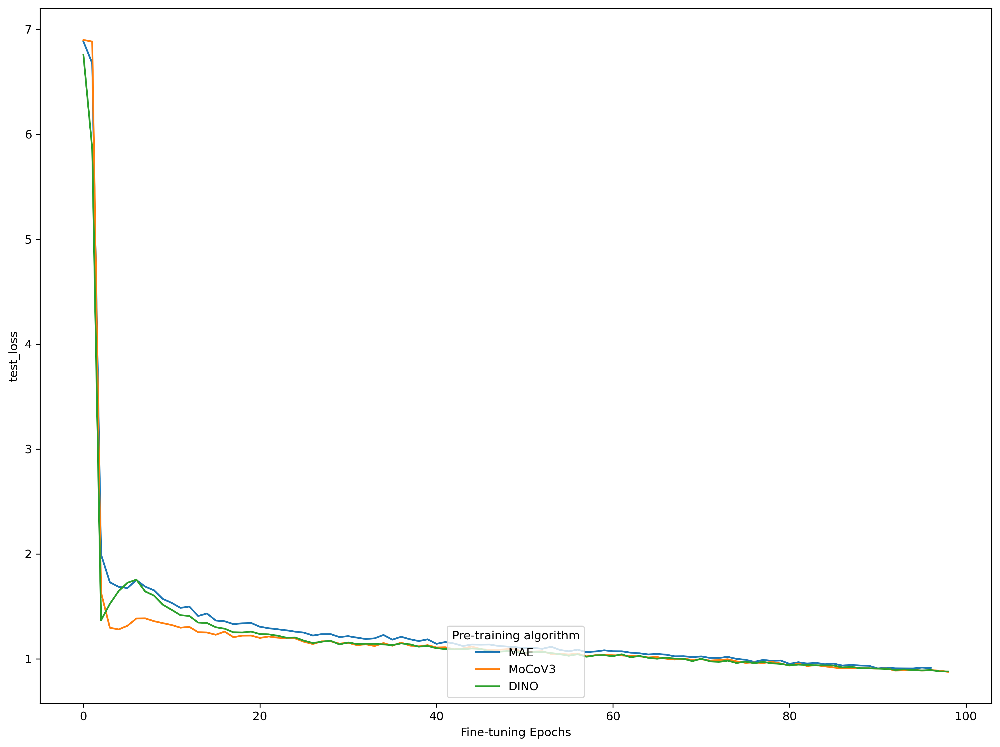

In [13]:
fig_dir = '../figures/dynamics/'

prod = itertools.combinations(results.keys(), 3)

for name1, name2, name3 in prod:

    #for col in ["L2-norm ΔParameters (LR scaled)", "L2-norm ΔParameters", "L2-norm Parameters", 
    #            "L2-norm ΔParameters (LR scaled, Cumulative Sum)", "L2-norm ΔParameters (Cumulative Sum)",
    #            "L2-norm ΔParameters / L2-norm Parameters", "L2-norm ΔParameters / L2-norm Parameters (converged)",
    #            "L2-norm ΔParameters / L2-norm Parameters (initial)"]:
    for col in ["test_acc1", "test_acc5", "test_loss"]:    
        full_fig_dir = fig_dir + col + '/'
        fig = dynamics_plot_single(full_fig_dir, results[name1], results[name2], results[name3], name1, name2, name3, col=col)

In [17]:
for col in module_cols:
    layer_name = col.split('train_module.')[-1]
    print(layer_name)

patch_embed
patch_embed.proj
blocks
blocks.0
blocks.0.norm1
blocks.0.attn
blocks.0.attn.qkv
blocks.0.attn.proj
blocks.0.norm2
blocks.0.mlp
blocks.0.mlp.fc1
blocks.0.mlp.fc2
blocks.1
blocks.1.norm1
blocks.1.attn
blocks.1.attn.qkv
blocks.1.attn.proj
blocks.1.norm2
blocks.1.mlp
blocks.1.mlp.fc1
blocks.1.mlp.fc2
blocks.2
blocks.2.norm1
blocks.2.attn
blocks.2.attn.qkv
blocks.2.attn.proj
blocks.2.norm2
blocks.2.mlp
blocks.2.mlp.fc1
blocks.2.mlp.fc2
blocks.3
blocks.3.norm1
blocks.3.attn
blocks.3.attn.qkv
blocks.3.attn.proj
blocks.3.norm2
blocks.3.mlp
blocks.3.mlp.fc1
blocks.3.mlp.fc2
blocks.4
blocks.4.norm1
blocks.4.attn
blocks.4.attn.qkv
blocks.4.attn.proj
blocks.4.norm2
blocks.4.mlp
blocks.4.mlp.fc1
blocks.4.mlp.fc2
blocks.5
blocks.5.norm1
blocks.5.attn
blocks.5.attn.qkv
blocks.5.attn.proj
blocks.5.norm2
blocks.5.mlp
blocks.5.mlp.fc1
blocks.5.mlp.fc2
blocks.6
blocks.6.norm1
blocks.6.attn
blocks.6.attn.qkv
blocks.6.attn.proj
blocks.6.norm2
blocks.6.mlp
blocks.6.mlp.fc1
blocks.6.mlp.fc2
block

In [ ]:
fig_dir = '../figures/dynamics/'

prod = itertools.combinations(results.keys(), 3)

for name1, name2, name3 in prod:

    for col in module_cols:
        layer_name = col.split('train_module.')[-1]
        print(layer_name)
        full_fig_dir = fig_dir + col + '/'
        fig = dynamics_plot_single(full_fig_dir, results[name1], results[name2], results[name3], name1, name2, name3, col=col+'_scaled')

In [18]:
ind_layers = ['norm1', 'attn', 'attn.qkv', 'attn.proj', 'norm2', 'mlp', 'mlp.fc1', 'mlp.fc2']

In [20]:
for k in results:
    results[k]['model'] = k

/tmp/ipykernel_3683817/4141680832.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  results[k]['model'] = k
/tmp/ipykernel_3683817/4141680832.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  results[k]['model'] = k
/tmp/ipykernel_3683817/4141680832.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy(

In [26]:
df_list = [*results.values()]

In [51]:
all_dfs = pd.concat(df_list)
all_dfs.reset_index(inplace=True)

/tmp/ipykernel_3683817/1233242335.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_dfs.reset_index(inplace=True)


In [105]:
def dynamics_plot_all_blocks(fig_dir, df, ind_layer):

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)

    fig, ax = plt.subplots(3, 4, figsize=(20, 16), dpi=300, sharex=True)

    for i in range(12):
        x = int(i/4)
        y = i%4

        col = 'train_module.blocks.' + str(i) + '.' + ind_layer + '_scaled'

        sns.lineplot(x='epoch', y=col, data = df, hue='model', ax = ax[x][y])
    
        ax[x][y].set_xlabel("Fine-tuning Epochs")
        ax[x][y].set_ylabel('blocks.' + str(i) + '.' + ind_layer)
        handles, labels = ax[x][y].get_legend_handles_labels()
        ax[x][y].get_legend().remove()
    
    fig.subplots_adjust(bottom=0.1, wspace=0.1)

    fig.legend(handles = handles, labels=labels, loc='lower center', 
             bbox_to_anchor=(0.5, -0.03),fancybox=False, shadow=False, ncol=3, prop={'size': 14})

    fig.suptitle('L2-norm ΔParameters per epoch / ΔParameters (final - initial) for ' + ind_layer + ' layer', fontsize=20,  y=1.01)

    plt.tight_layout()
    plt.show()

    fig.savefig(fig_dir+ind_layer + '_scaled'+'.png', dpi=300, bbox_inches = "tight")

    return fig

norm1


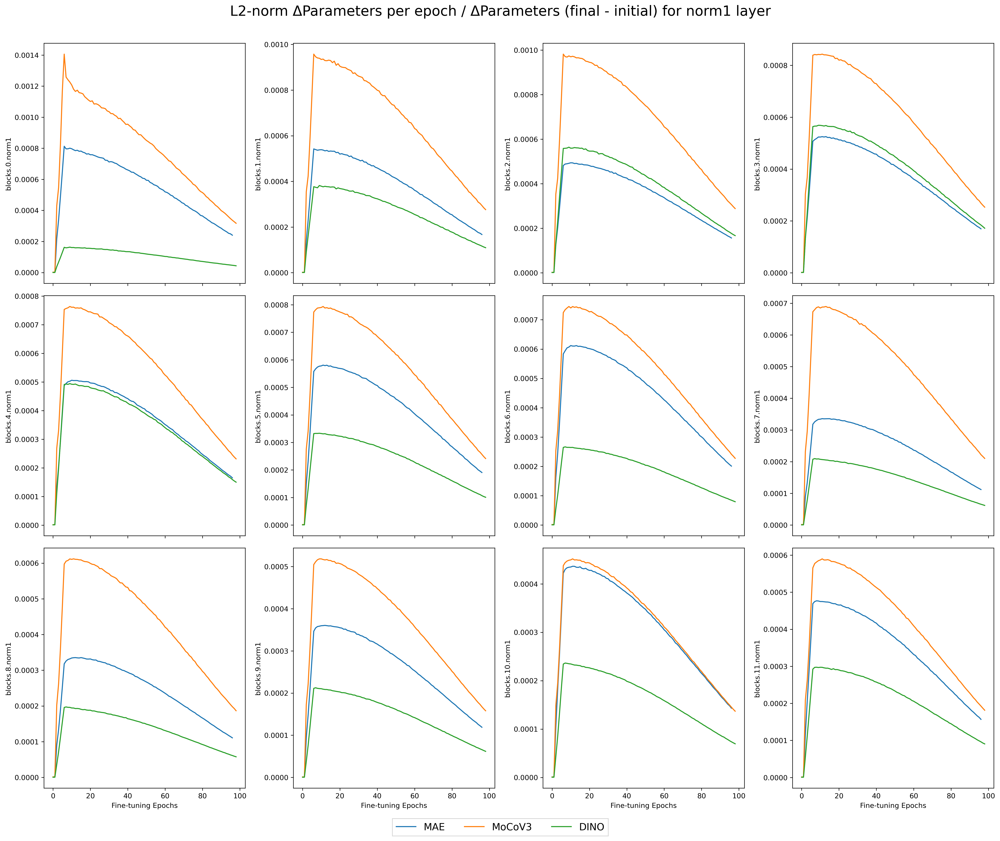

attn


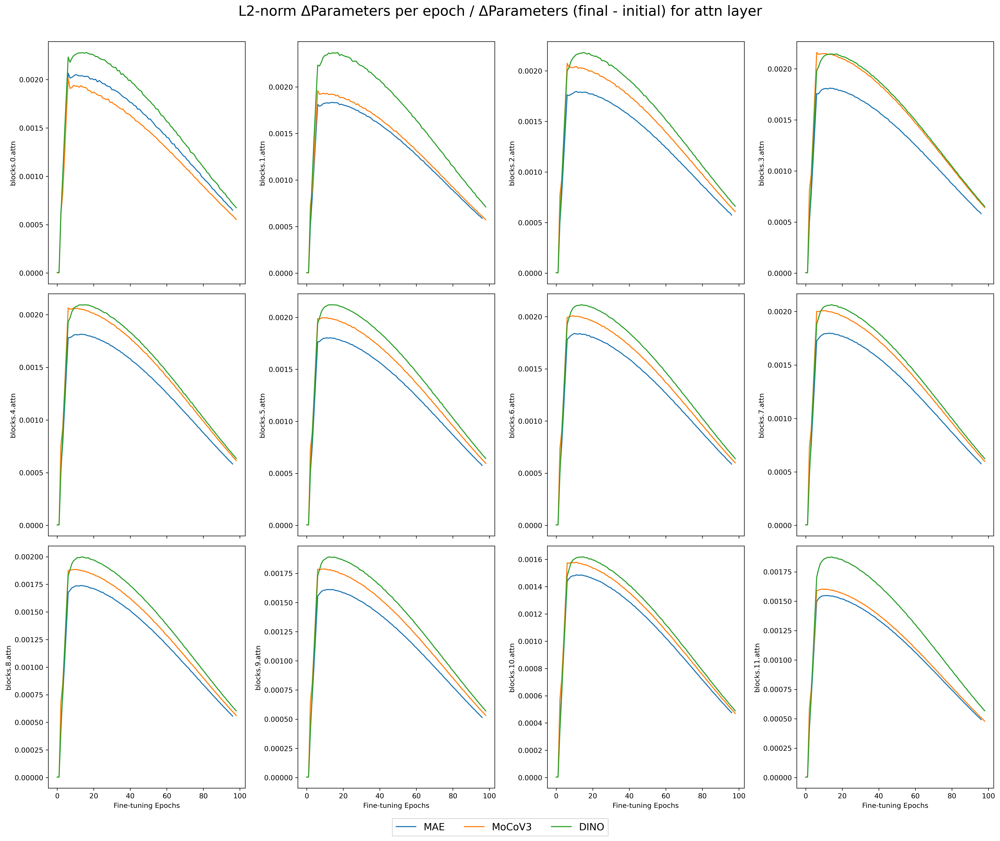

attn.qkv


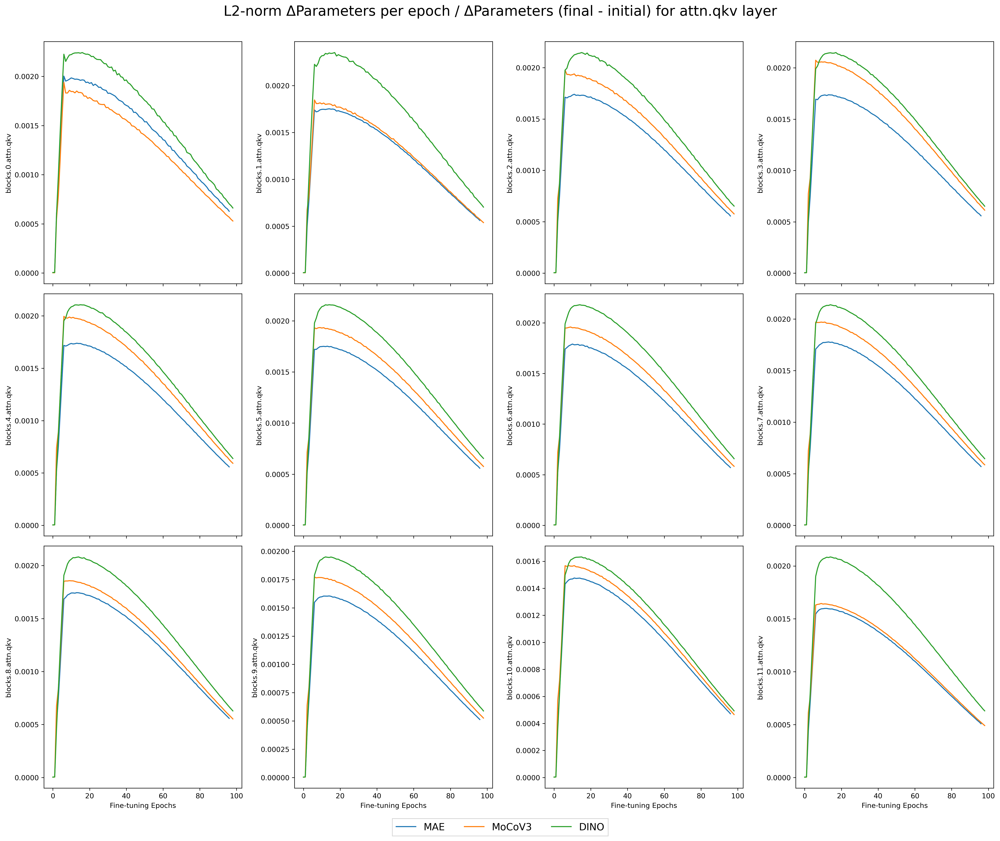

attn.proj


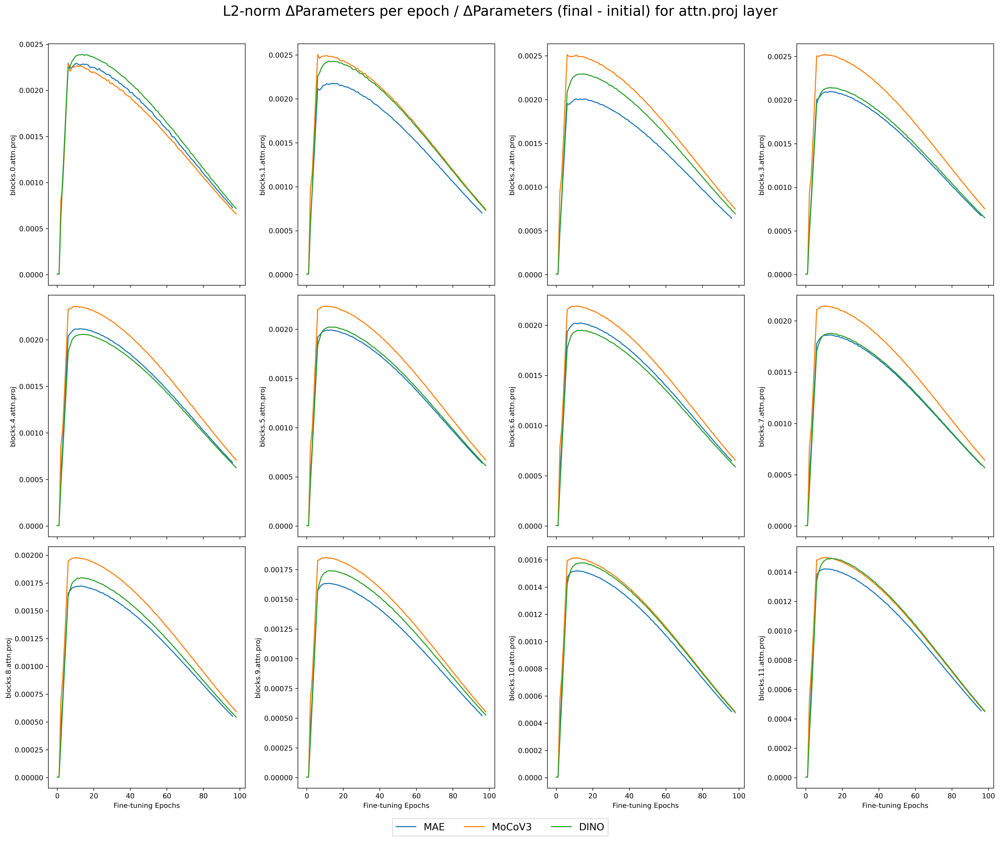

norm2


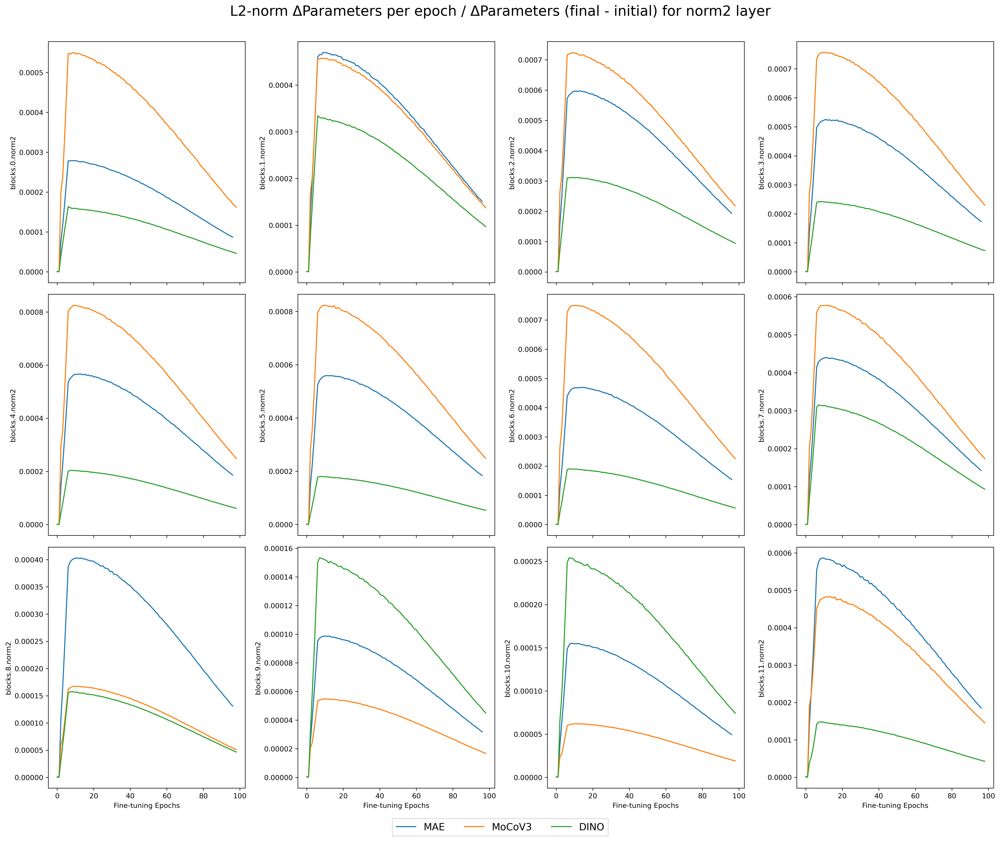

mlp


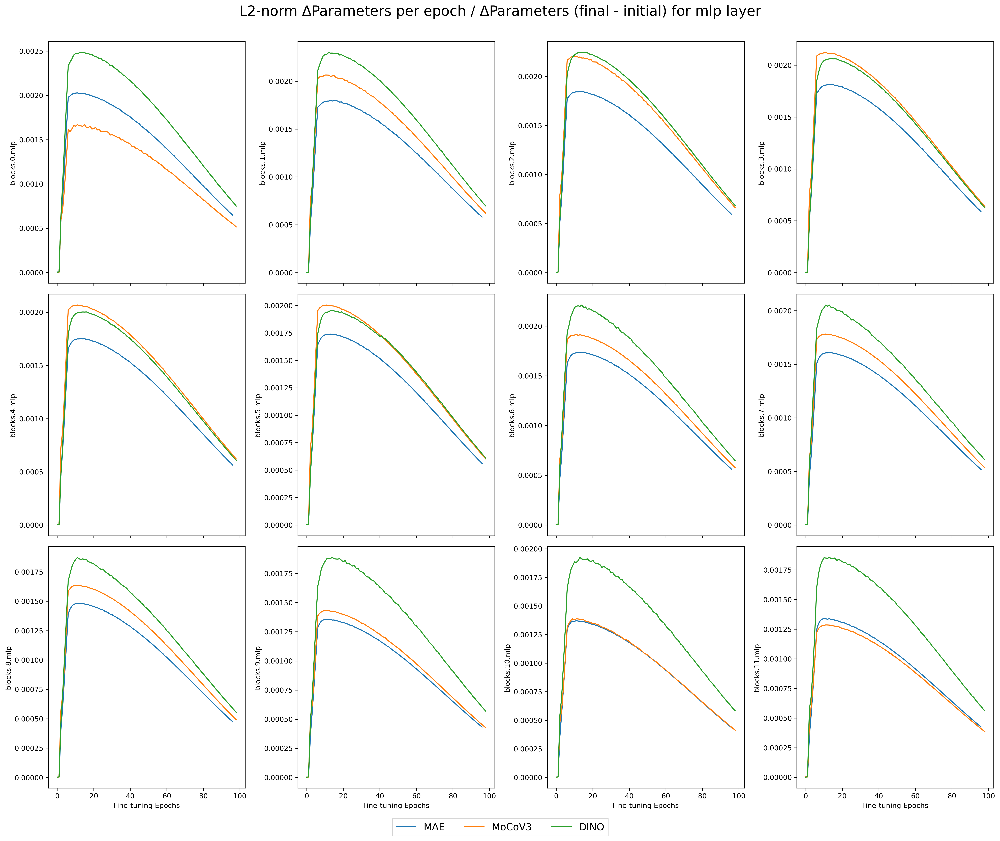

mlp.fc1


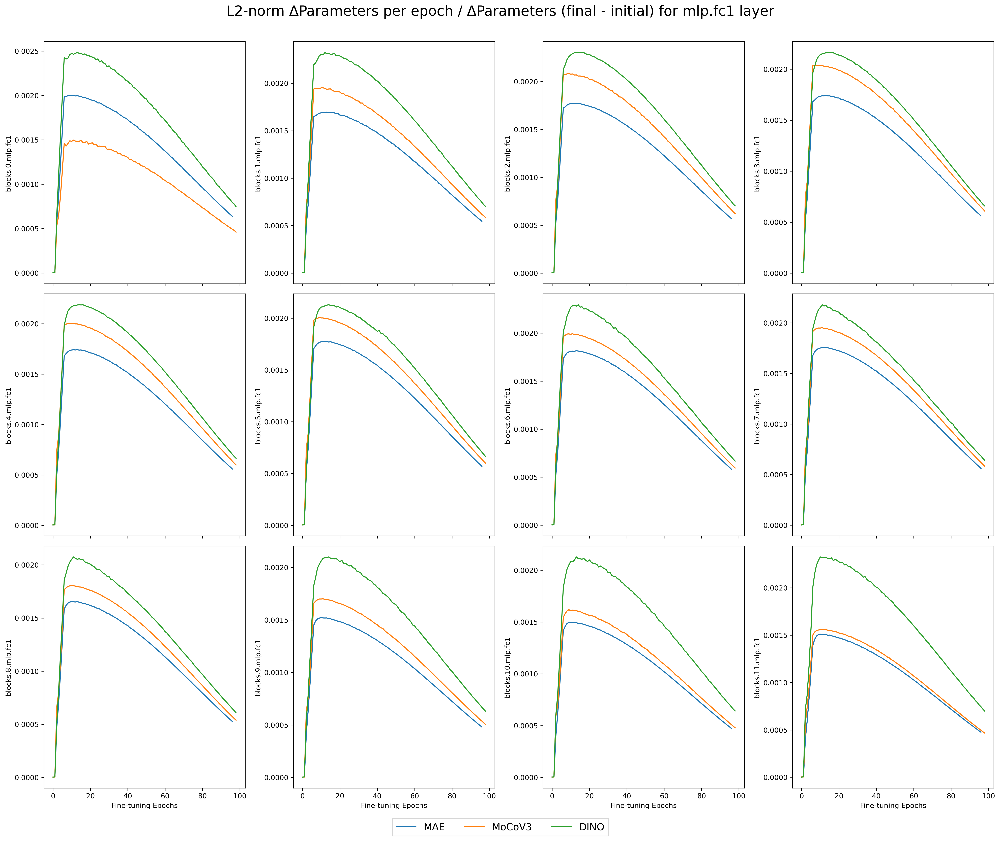

mlp.fc2


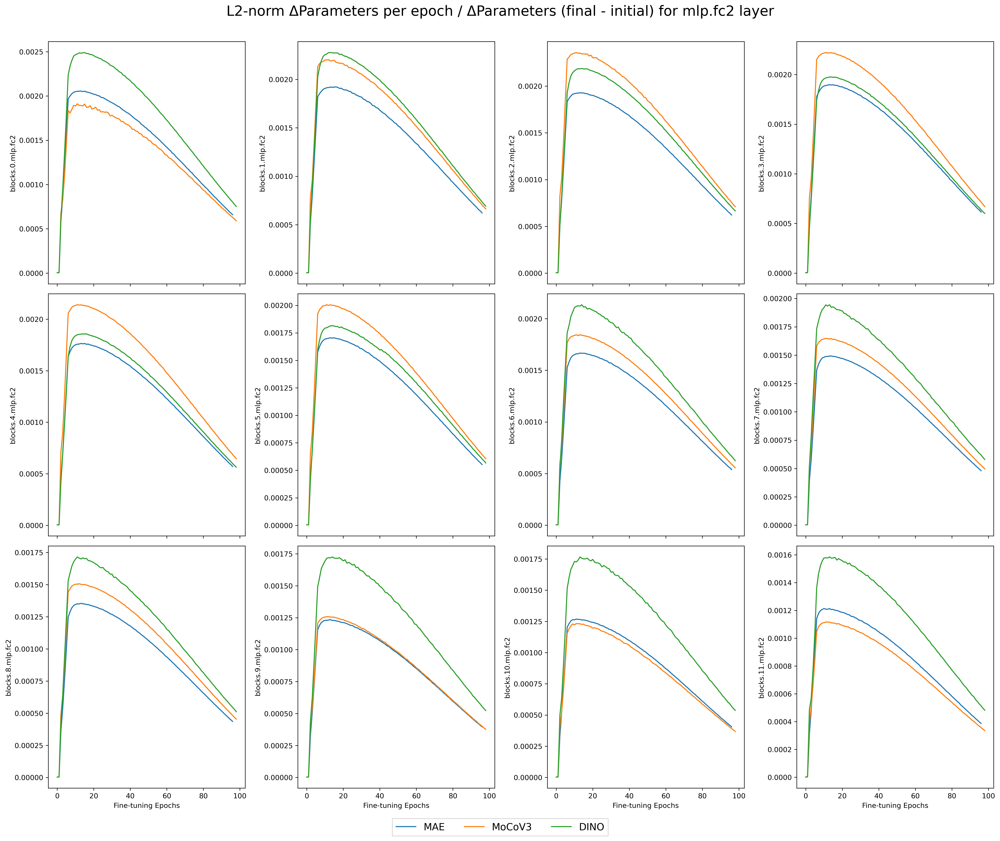

In [106]:
fig_dir = '../figures/dynamics/layer-wise/'

for layer in ind_layers:
        print(layer)
        full_fig_dir = fig_dir + layer + '/'
        fig = dynamics_plot_all_blocks(full_fig_dir, all_dfs, layer)